<br><br><center><h1 style="font-size:2em;color:#2467C0">Caso de estudio: Reconocimiento facial de emociones</h1></center>
<br><br><center><h1 style="font-size:2em;color:#2467C0">Elaborado por: <a href=https://github.com/Efrenjm>Efrén Jiménez Mukul</a></h1></center>
<br><br><center><h1 style="font-size:2em;color:#2467C0">Profesor: <a href="https://github.com/enriquecamacho"> Enrique Camacho</a></h1></center>

# Adquisición de datos

Los datos de entrenamiento y de prueba se obtendrán del repositorio https://github.com/Efrenjm/Estados_de_animo

In [14]:
!wget https://github.com/Efrenjm/Estados_de_animo/raw/main/img_faces.csv

--2023-03-17 18:26:03--  https://github.com/Efrenjm/Estados_de_animo/raw/main/img_faces.csv
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Efrenjm/Estados_de_animo/main/img_faces.csv [following]
--2023-03-17 18:26:03--  https://raw.githubusercontent.com/Efrenjm/Estados_de_animo/main/img_faces.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78863100 (75M) [text/plain]
Saving to: ‘img_faces.csv.3’

img_faces.csv.3     100%[===================>]  75.21M   375MB/s    in 0.2s    

2023-03-17 18:26:03 (375 MB/s) - ‘img_faces.csv.3’ saved [78863100/78863100]



In [15]:
ls

img_faces.csv  img_faces.csv.1  img_faces.csv.2  img_faces.csv.3  sample_data/


# Preeliminares



* ## _Importación de librerías_

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

* ## _Importación de datos_

In [2]:
df = pd.read_csv('img_faces.csv',header=None,dtype='uint8')
print("total de elementos en la base de datos", len(df))

total de elementos en la base de datos 13166


* ## _Segmentación de datos:_

In [3]:
df_train = df.iloc[:9216,:]
print("\ntotal de elementos para entrenamiento", len(df_train),"\n")
df_train.head()


total de elementos para entrenamiento 9216 



,0,1,2,3,4,5,6,7,8,9,...,1591,1592,1593,1594,1595,1596,1597,1598,1599,1600
0,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,64
1,0,64,75,121,141,182,203,208,206,205,...,166,167,174,162,152,133,149,148,130,121
2,0,184,186,178,173,161,144,141,133,127,...,27,30,33,29,23,28,27,25,25,25
3,0,130,131,139,141,145,153,157,168,169,...,160,164,172,173,130,117,114,137,153,151
4,0,123,122,133,131,125,126,122,116,110,...,121,119,128,135,111,112,119,103,93,104


In [4]:
df_test = df.iloc[9216:,:]
print("\ntotal de elementos para prueba", len(df_test),"\n")
df_test.head()


total de elementos para prueba 3950 



,0,1,2,3,4,5,6,7,8,9,...,1591,1592,1593,1594,1595,1596,1597,1598,1599,1600
9216,0,105,105,114,106,103,99,96,87,87,...,58,57,52,54,50,42,44,47,48,55
9217,0,72,80,96,100,101,97,95,95,94,...,88,92,91,88,165,231,246,245,243,170
9218,0,52,61,95,117,165,185,189,192,192,...,89,91,92,95,97,87,78,44,27,11
9219,0,135,134,135,137,150,161,164,155,157,...,159,159,160,167,170,165,163,150,150,146
9220,0,92,90,92,93,95,93,96,97,96,...,110,110,104,103,108,123,118,14,8,3


* ## _Muestra de una imagen aleatoria de nuestra base de datos_

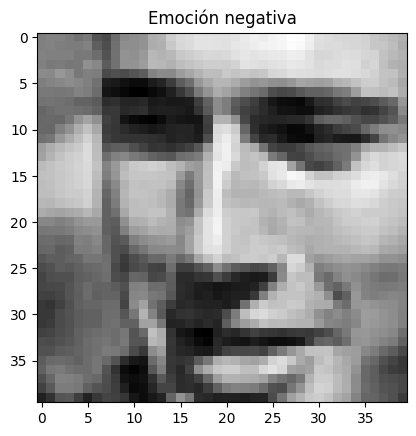

In [5]:
rand = 1026

random_face = df_train.iloc[rand][1:].values.reshape((40,40))
plt.imshow(random_face,cmap='gray')
plt.title("Emoción postiva" if df_train.iloc[rand][0] == 1 else "Emoción negativa")
plt.show()

# Creación del modelo


* ## _Preparación de los datos_

In [6]:
# Definir los conjuntos de datos de las muestras de entrenamiento y prueba
X_train=df_train.iloc[:,1:]
y_train=df_train.iloc[:,0]

X_test=df_test.iloc[:,1:]
y_test=df_test.iloc[:,0]

* ## _Definición del pipeline y el modelo_

In [7]:
# Definir el pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

steps=[
    ('scaler',StandardScaler()),
    ('RandomForestClassifier',RandomForestClassifier())
]
pipeline=Pipeline(steps)

In [8]:
# Definir los parámetros
parametros={'RandomForestClassifier__max_depth': [None,1,5,10], 
            #'RandomForestClassifier__min_samples_leaf': [1,5,10],
            'RandomForestClassifier__criterion': ['gini', 'entropy', 'log_loss'],
            'RandomForestClassifier__max_features': ['sqrt','log2',None,1,5,10],
            }

In [9]:
# Hacer el tuning
from sklearn.model_selection import GridSearchCV
model_grid=GridSearchCV(pipeline, param_grid=parametros, cv=5, n_jobs=-1, verbose=5)

In [10]:
model_grid.get_params()

{'cv': 5,
 'error_score': nan,
 'estimator__memory': None,
 'estimator__steps': [('scaler', StandardScaler()),
  ('RandomForestClassifier', RandomForestClassifier())],
 'estimator__verbose': False,
 'estimator__scaler': StandardScaler(),
 'estimator__RandomForestClassifier': RandomForestClassifier(),
 'estimator__scaler__copy': True,
 'estimator__scaler__with_mean': True,
 'estimator__scaler__with_std': True,
 'estimator__RandomForestClassifier__bootstrap': True,
 'estimator__RandomForestClassifier__ccp_alpha': 0.0,
 'estimator__RandomForestClassifier__class_weight': None,
 'estimator__RandomForestClassifier__criterion': 'gini',
 'estimator__RandomForestClassifier__max_depth': None,
 'estimator__RandomForestClassifier__max_features': 'sqrt',
 'estimator__RandomForestClassifier__max_leaf_nodes': None,
 'estimator__RandomForestClassifier__max_samples': None,
 'estimator__RandomForestClassifier__min_impurity_decrease': 0.0,
 'estimator__RandomForestClassifier__min_samples_leaf': 1,
 'esti

In [11]:
#Ajuste
model_grid.fit(X_train,y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV 1/5] END RandomForestClassifier__criterion=gini, RandomForestClassifier__max_depth=None, RandomForestClassifier__max_features=sqrt;, score=0.847 total time= 1.1min
[CV 2/5] END RandomForestClassifier__criterion=gini, RandomForestClassifier__max_depth=None, RandomForestClassifier__max_features=sqrt;, score=0.851 total time= 1.1min
[CV 3/5] END RandomForestClassifier__criterion=gini, RandomForestClassifier__max_depth=None, RandomForestClassifier__max_features=sqrt;, score=0.833 total time= 1.1min
[CV 4/5] END RandomForestClassifier__criterion=gini, RandomForestClassifier__max_depth=None, RandomForestClassifier__max_features=sqrt;, score=0.846 total time= 1.1min
[CV 1/5] END RandomForestClassifier__criterion=gini, RandomForestClassifier__max_depth=None, RandomForestClassifier__max_features=log2;, score=0.830 total time=  16.2s
[CV 2/5] END RandomForestClassifier__criterion=gini, RandomForestClassifier__max_depth=None, Rando

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('RandomForestClassifier',
                                        RandomForestClassifier())]),
             n_jobs=-1,
             param_grid={'RandomForestClassifier__criterion': ['gini',
                                                               'entropy',
                                                               'log_loss'],
                         'RandomForestClassifier__max_depth': [None, 1, 5, 10],
                         'RandomForestClassifier__max_features': ['sqrt',
                                                                  'log2', None,
                                                                  1, 5, 10]},
             verbose=5)

In [12]:
#mostrar los mejores valores del tuning
model_grid.best_params_

{'RandomForestClassifier__criterion': 'entropy',
 'RandomForestClassifier__max_depth': None,
 'RandomForestClassifier__max_features': None}

In [13]:
# Encontrar el score
model_grid.score(X_test,y_test) 

0.850886075949367

# Modelo final

El modelo planteado es un Random Forest con los parámetros Criterion = Entropy, Max depth = None y Max Feature = None. 

In [17]:
model = RandomForestClassifier(criterion = 'entropy',
                                max_depth = None,
                                max_features = None)

In [18]:
model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_features=None)

In [19]:
model.score(X_test,y_test)

0.8536708860759493

# Prediciendo rostros

Para poder predecir en otras imágenes es necesario que las caras tengan las mismas dimensiones. En este caso se utilizará el clasificador Haar Cascade para detectar los rostros de imágenes de banners de series de televisión.

In [103]:
import cv2 as cv
face_cascade = cv.CascadeClassifier('datos/haarcascade_frontalface_default.xml') 
def predict(img, scaleFactor=1.12, minNeighbors=5):
     img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
     faces = face_cascade.detectMultiScale(img_gray, scaleFactor, minNeighbors)
     df = pd.DataFrame()
     cont = 0
     imrows = int(len(faces)//2 + 1)
     for (x,y,w,h) in faces:
          face = img[y:y+h , x:x+w]
          plt.subplot(imrows, 2, cont+1)
          plt.imshow(face)
          
          face = cv.resize(img_gray[y:y+h , x:x+w], (40,40), interpolation = cv.INTER_LINEAR)
          df = df.append(pd.Series(face.flatten()), ignore_index=True )
          cont+=1
     plt.suptitle("Faces")
     plt.show()
     y_predict = model.predict(df)
     print('Predicciones del modelo: ', y_predict)

## Big Bang Theory

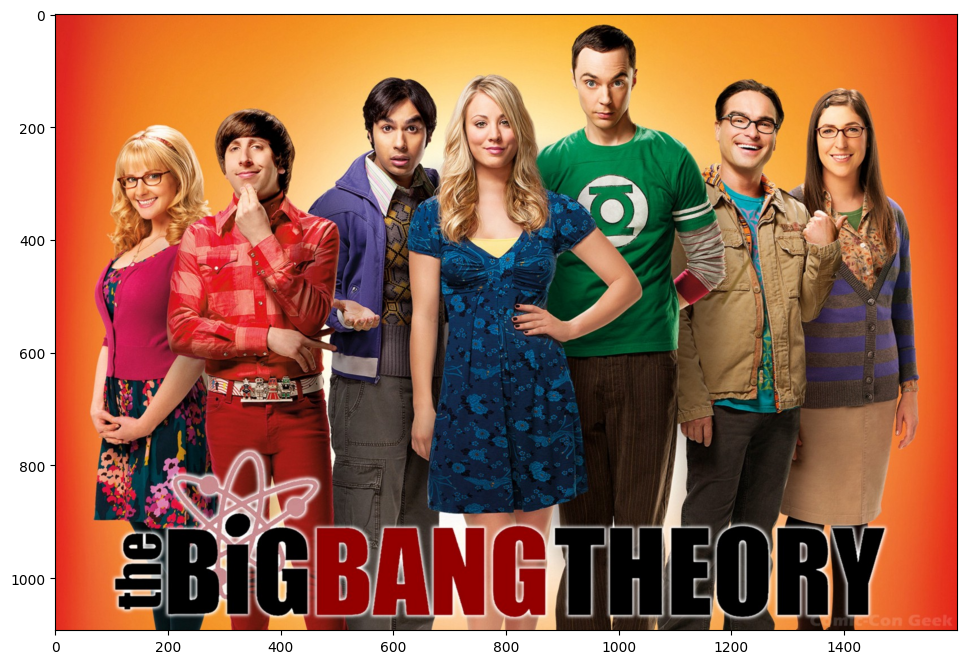

In [159]:
img = cv.imread('figuras/bbt.jpeg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

#### Rostros detectados y predicción del modelo

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

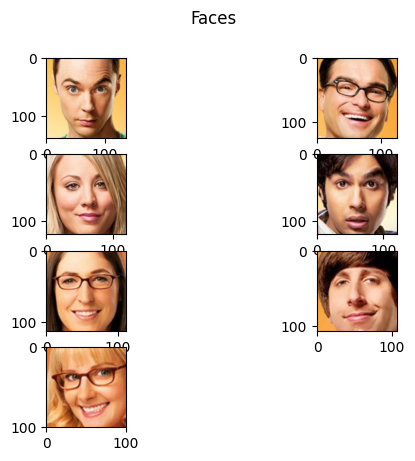

Predicciones del modelo:  [0 0 0 0 0 0 1]


In [160]:
predict(img)

In [161]:
rostros_testeados = 7
acertados = 3
falsos_positivos = 0
falsos_negativos = 4

#### Conclusión y análisis



En este caso obtuvimos que solo la última cara es una cara con emoción positiva y todas las demás fueron negativas.

Por las reacciones de los personajes, la clasificación real sería [0 1 1 0 1 1 1], por lo tanto, para este caso, acertó 3 de 7 gestos.

## Back to the Future

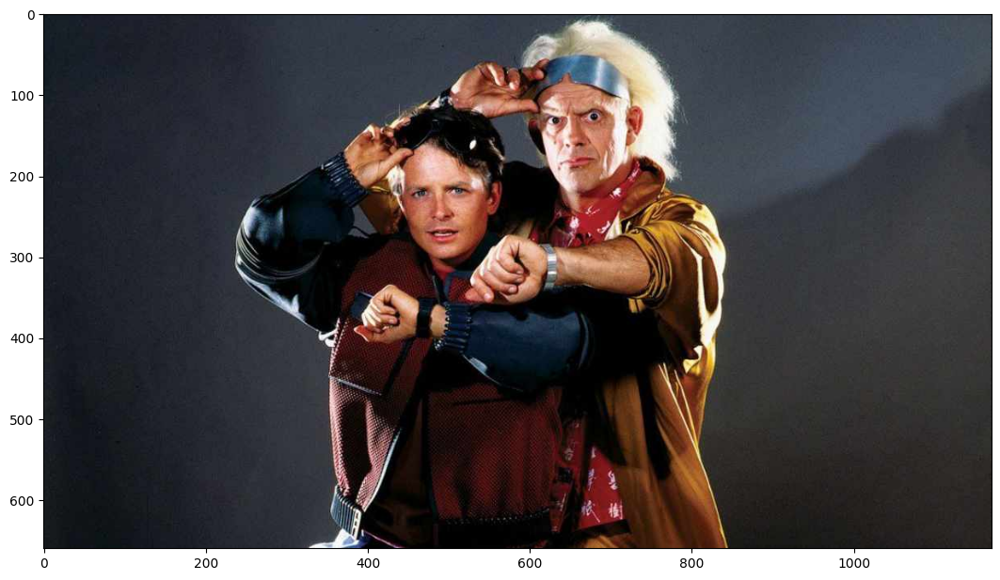

In [162]:
img = cv.imread('figuras/btf.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

#### Rostros detectados y predicción del modelo

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )


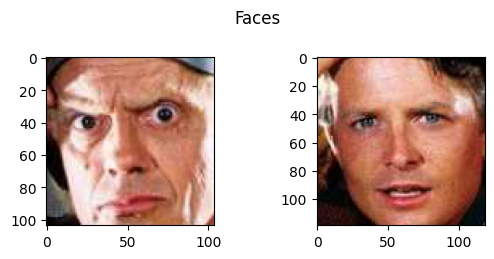

Predicciones del modelo:  [0 0]


In [163]:
predict(img)

In [164]:
rostros_testeados += 2
acertados += 2
falsos_positivos += 0
falsos_negativos += 0

#### Conclusión y análisis


En este caso el modelo pudo predecir correctamente a ambos rostros.

## Orange is the New Black

### Primera imagen

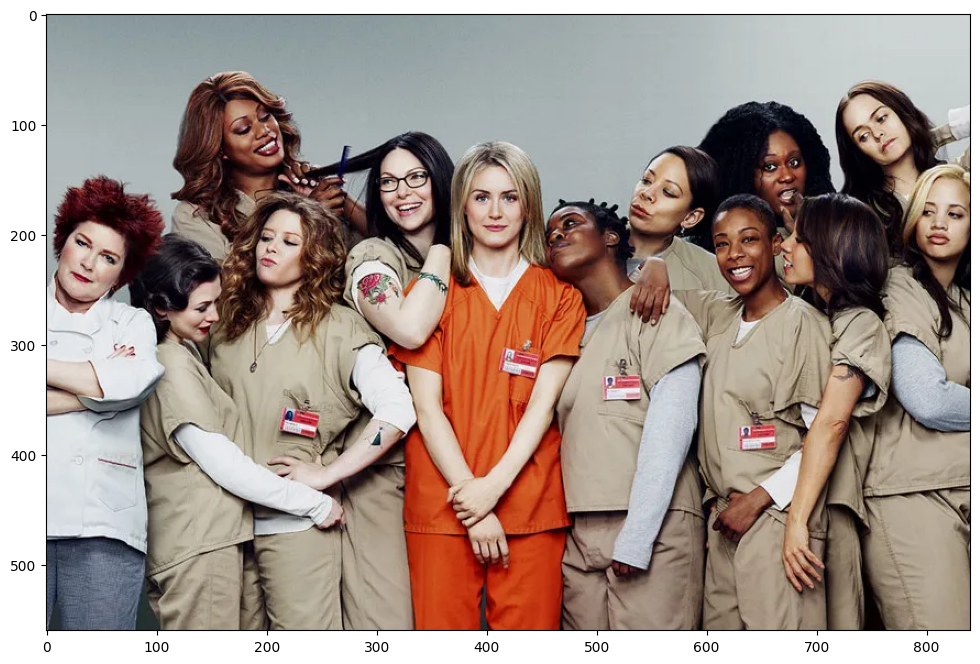

In [165]:
img = cv.imread('figuras/oitnb.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

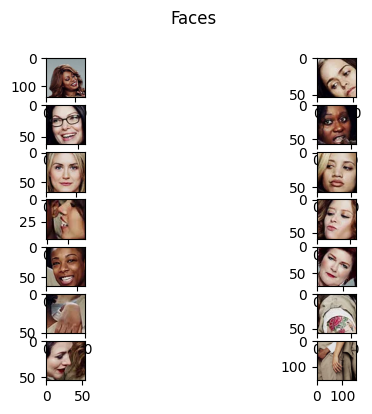

Predicciones del modelo:  [0 0 0 0 0 0 0 0 1 1 0 0 0 0]


In [174]:
predict(img,1.01,11)

In [175]:
rostros_testeados += 11
acertados += 7
falsos_positivos += 0
falsos_negativos += 4

#### Conclusión y análisis

Las imágenes 10, 11 y 13 no son rostros, por lo que se omitirán.

En este caso, la predicción fue [0 0 0 0 0 0 0 0 1 1 0] pero los resultados reales son [1 0 1 0 1 0 0 0 1 1 1], por lo que en este caso acertó 7 de 11 casos

### Segunda imagen

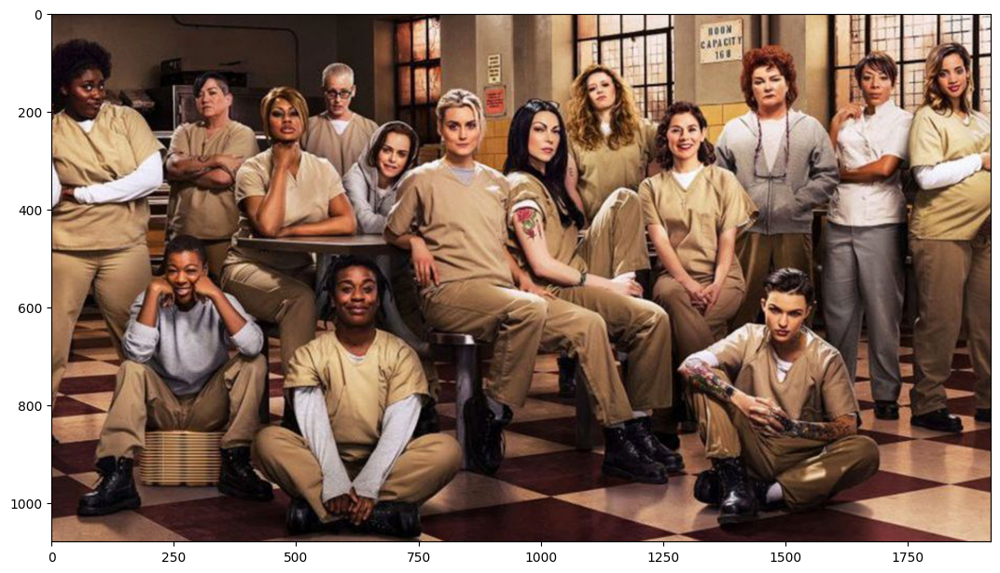

In [176]:
img = cv.imread('figuras/oitnb2.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

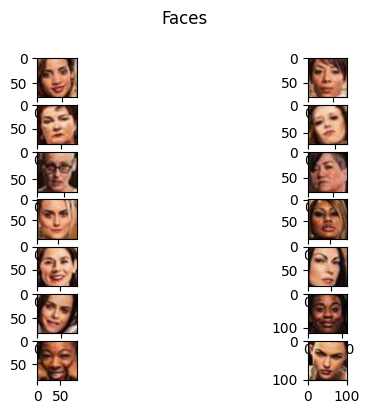

Predicciones del modelo:  [0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [177]:
predict(img,1.2)

In [178]:
rostros_testeados += 14
acertados += 8
falsos_positivos += 0
falsos_negativos += 6

#### Conclusión y análisis

De las caras obtenidas, los resultados reales serían [1 0 0 0 0 0 1 1 0 1 1 1 0], entonces, el modelo acertó en 8 de 14 casos.

## Last one laughing

### Primera imagen

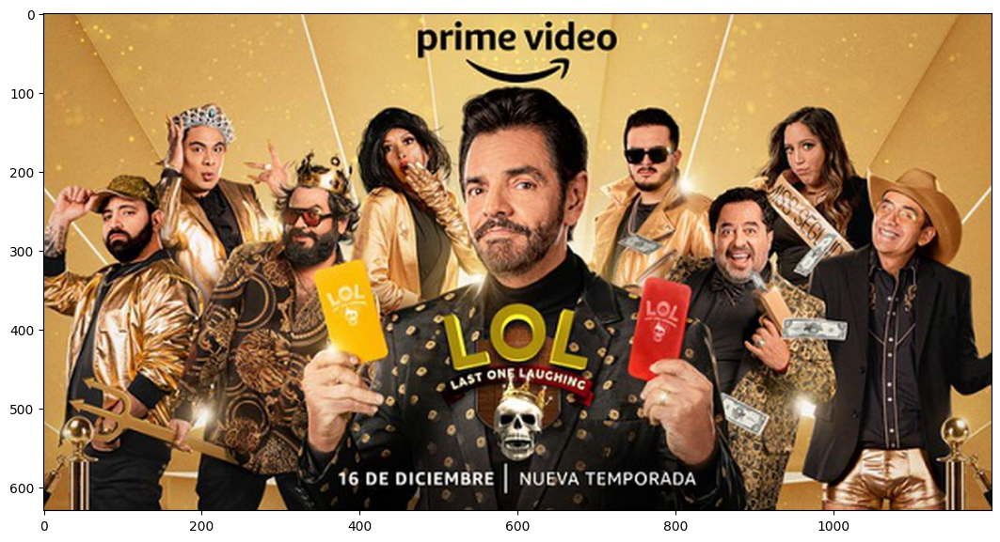

In [179]:
img = cv.imread('figuras/lol.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

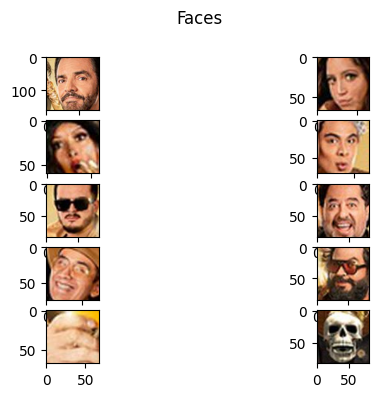

Predicciones del modelo:  [0 0 0 0 0 0 0 0 0 0]


In [180]:
predict(img)

In [181]:
rostros_testeados += 8
acertados += 5
falsos_positivos += 0
falsos_negativos += 3

#### Conclusión y análisis

La imagen con índice 8 y 9 no son  caras, por lo que se omitirán tales resultados

En este caso, la predicción fue [0 0 0 0 0 0 0 0] pero los resultados reales son [0 0 0 0 0 1 1 1], por lo que en este caso acertó 5 de 8 casos.

### Segunda imagen

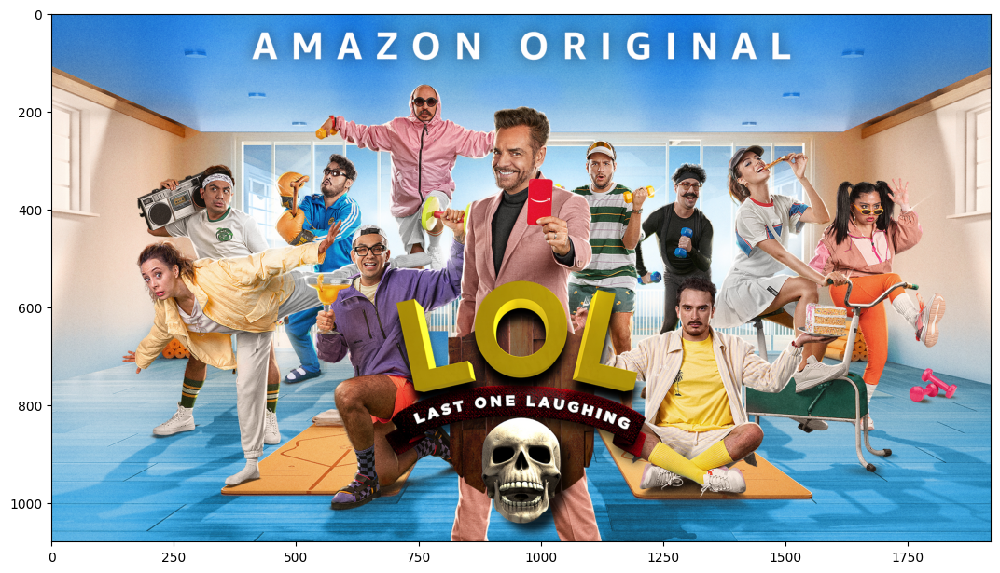

In [182]:
img = cv.imread('figuras/lol2.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

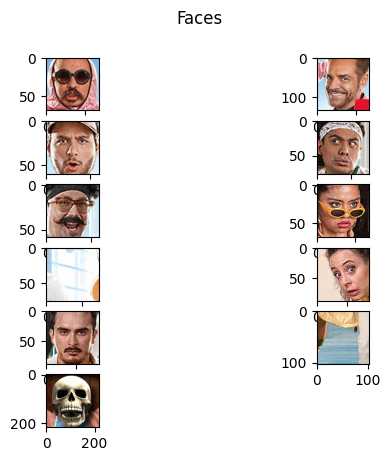

Predicciones del modelo:  [0 0 0 0 0 1 0 0 0 0 0]


In [183]:
predict(img,1.12)

In [184]:
rostros_testeados += 8
acertados += 5
falsos_positivos += 1
falsos_negativos += 2

#### Conclusión y análisis

En este caso no se contarán los resultados para las imágenes con índices 6, 9 y 10.

En este caso, la predicción fue [0 0 0 0 0 1 0 0] pero los resultados reales son [0 1 0 0 1 0 0 0], por lo que en este caso acertó 5 de 8 casos.

## The good place

### Primera imagen

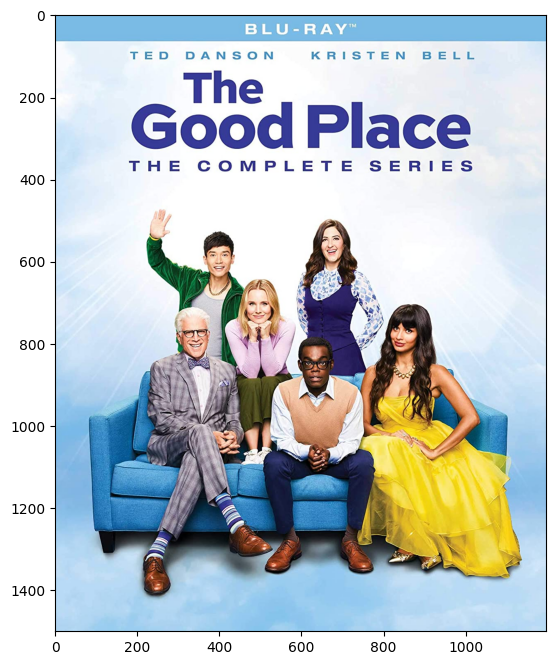

In [185]:
img = cv.imread('figuras/tgp.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

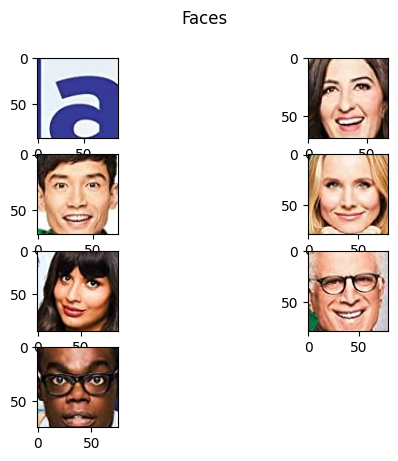

Predicciones del modelo:  [0 0 0 0 0 0 0]


In [186]:
predict(img,1.05,7)

In [187]:
rostros_testeados += 6
acertados += 1
falsos_positivos += 0
falsos_negativos += 5

#### Conclusión y análisis


En este modelo la primera imagen no es una cara, por lo que no se tomará en cuenta ese resultado.

En este caso, la predicción fue [0 0 0 0 0 0] pero los resultados reales son [1 1 1 1 1 0], por lo que en este caso acertó 1 de 6 casos.

### Segunda imagen

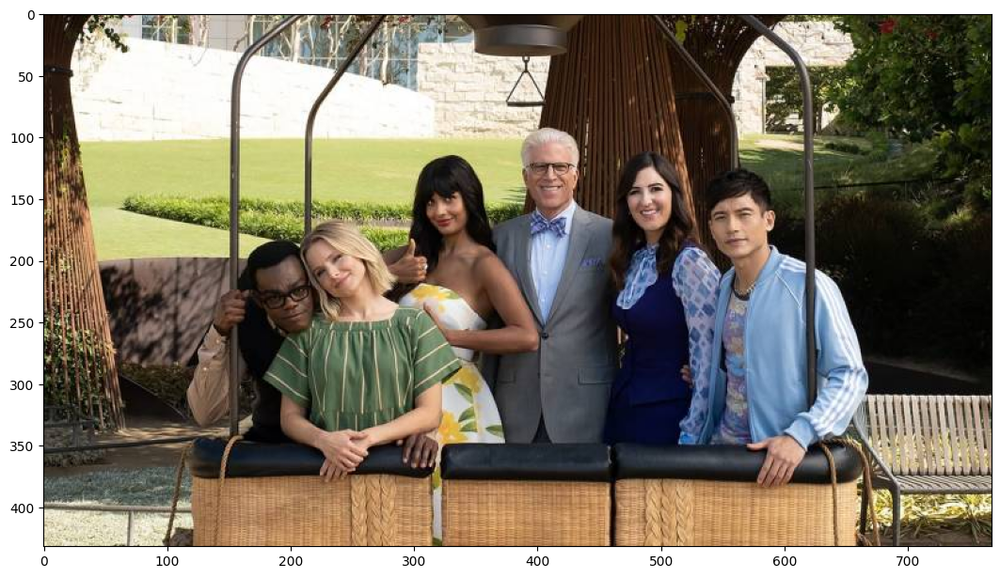

In [188]:
img = cv.imread('figuras/tgp2.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

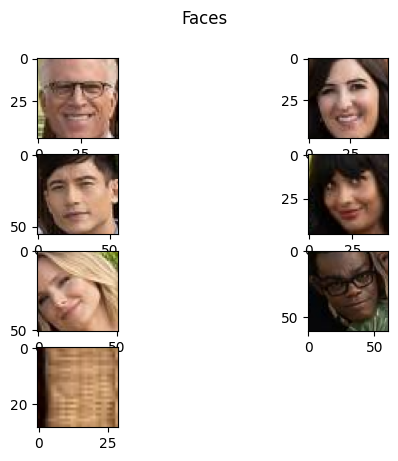

Predicciones del modelo:  [0 0 0 0 0 0 0]


In [189]:
predict(img,1.01,7)

In [190]:
rostros_testeados += 6
acertados += 2
falsos_positivos += 0
falsos_negativos += 4

#### Conclusión y análisis

La última imagen no es una cara, por lo que no se tomará en cuenta.

En este caso, la predicción fue [0 0 0 0 0 0] pero los resultados reales son [1 1 1 0 1 0], por lo que en este caso acertó 2 de 6 casos

## The office

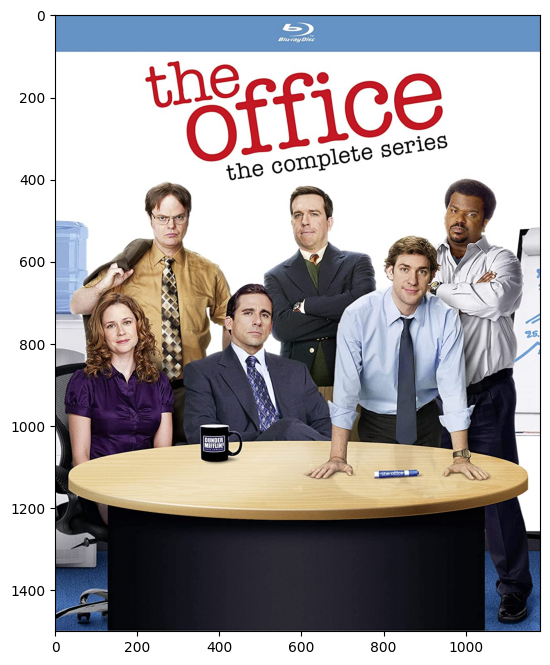

In [191]:
img = cv.imread('figuras/the office.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(13,8))
plt.imshow(img)
plt.show()

/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.Series(face.flatten()), ignore_index=True )
/var/folders/rd/t2ps2kgx67l44kt9836gwyc40000gn/T/ipykernel_10306/4116866497.py:16: FutureWarning: The frame.append method is deprecated and will be removed from

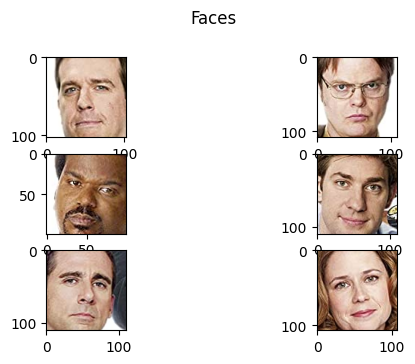

Predicciones del modelo:  [0 0 0 0 0 0]


In [192]:
predict(img,1.2)

In [193]:
rostros_testeados += 6
acertados += 4
falsos_positivos += 0
falsos_negativos += 2

#### Conclusión y análisis

En este caso, la predicción fue [0 0 0 0 0 0] pero los resultados reales son [0 0 0 1 0 1], por lo que en este caso acertó 4 de 6 casos. 

# Conclusión final

In [196]:
print("Rostros testeados: ", rostros_testeados)
print("Casos acertados: ", acertados)
print("Casos incorrectos: ", falsos_negativos + falsos_positivos)
print("Falsos positivos: ", falsos_positivos)
print("Falsos negativos: ", falsos_negativos)
print("Score: ", acertados/rostros_testeados)
print("Error de negativos: ", falsos_negativos/(falsos_negativos+falsos_positivos))
print("Error de positivos: ", falsos_positivos/(falsos_negativos+falsos_positivos))

Rostros testeados:  68
Casos acertados:  37
Casos incorrectos:  31
Falsos positivos:  1
Falsos negativos:  30
Score:  0.5441176470588235
Error de negativos:  0.967741935483871
Error de positivos:  0.03225806451612903


De todos los casos testeados se acertó en solo el 54% de los casos y el 97% de los errores fue por falsos negativos. Esto se debe a que la base de datos usada para hacer el entrenamiento del modelo contaba con 9,473 casos negativos y 3,695 y a que al intentar aplicar el modelo en imágenes con dimensiones diferentes se debe de hacer un resize que haga que la imagen se vea muy pixeleada.